In [4]:
from CoreSampleImage import CoreSampleImage
from CoreSampleColumn import CoreSampleColumn
from utils import PixelScaler, smooth1D

import numpy as np
from skimage import morphology, measure, img_as_uint

import matplotlib.pyplot as plt

from utils import PixelScaler, smooth1D

example_file = "CorePhotos/CoreLab_WL/Core_1/10700.0-10703.7.tif"
example_file1 = "CorePhotos/CoreLab_WL/Core_1/10620.0-10630.0__c1.tif"
example_file2 = "CorePhotos/CoreLab_WL/Core_2/10882.0-10883.8.tif"
example_file3 = "CorePhotos/CoreLab_WL/Core_3/10912.0-10922.0.tif"
example_file4 = "CorePhotos/CoreLab_WL/Core_4/11056.0-11066.0.tif"

%matplotlib inline

In [5]:
#c = CoreSampleImage(fname=example_file)
c1 = CoreSampleImage(fname=example_file1, dtype='ubyte')
#c2 = CoreSampleImage(fname=example_file2)
#c3 = CoreSampleImage(fname=example_file3)
#c4 = CoreSampleImage(fname=example_file4)

image.gimg.dtype =  uint8


/home/ross/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


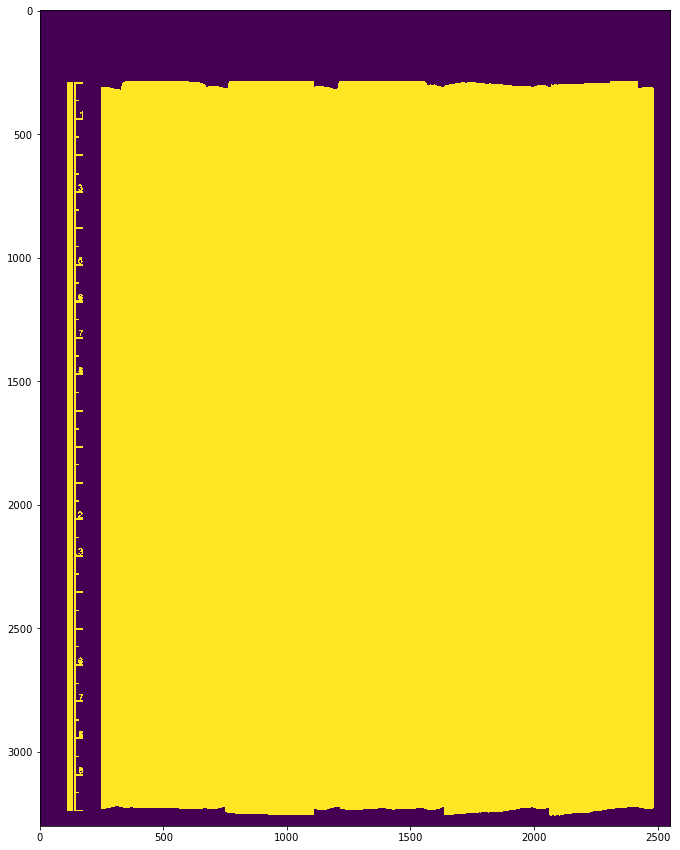

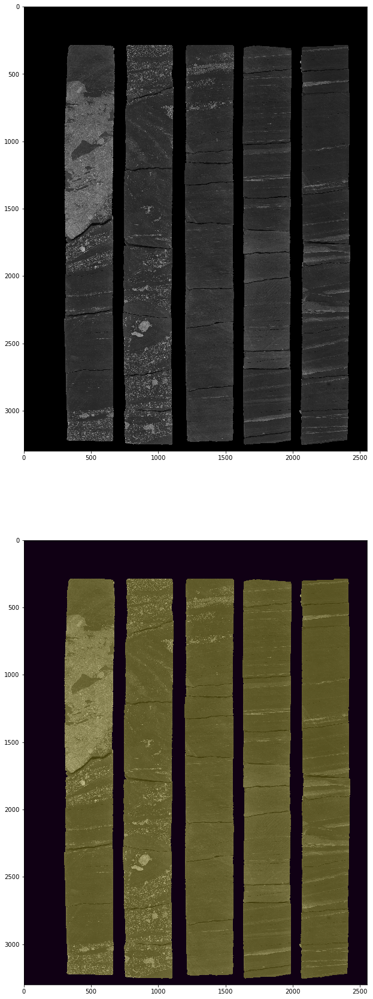

image.gimg.dtype =  uint8


In [6]:
c1.segment()

label:  1
bbox:  (290, 297, 3229, 677)
label:  2
bbox:  (290, 734, 3255, 1114)
label:  3
bbox:  (290, 1192, 3234, 1564)
label:  5
bbox:  (294, 1624, 3255, 1990)
label:  4
bbox:  (290, 2044, 3256, 2426)


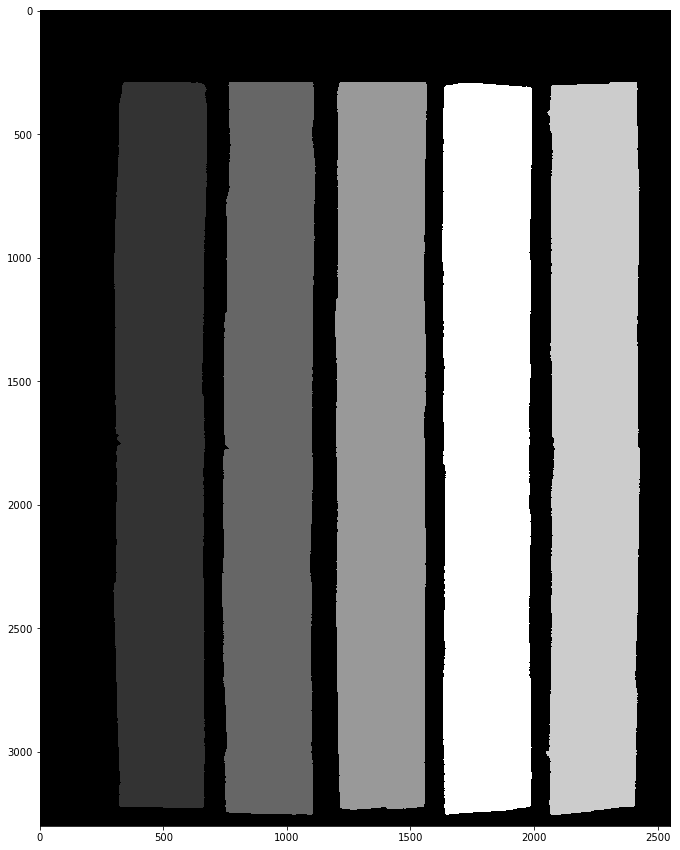

In [4]:
fig, ax = plt.subplots(figsize=(15,15))

labels = measure.label(c1.rock)
props = measure.regionprops(labels)
props.sort(key=lambda x: x.bbox[1])
for prop in props:
    print("label: ", prop.label)
    print("bbox: ", prop.bbox)

ax.imshow(labels, cmap='gray')

In [7]:
column = c1.stack_columns()

column.uimg.dtype =  uint8
column.uimg.dtype =  uint8
column.uimg.dtype =  uint8
column.uimg.dtype =  uint8
column.uimg.dtype =  uint8
uint8  +  uint8
column.uimg.dtype =  uint8
uint8  +  uint8
column.uimg.dtype =  uint8
uint8  +  uint8
column.uimg.dtype =  uint8
uint8  +  uint8
column.uimg.dtype =  uint8


column.uimg.dtype =  uint8


/home/ross/Documents/DU_Courses/Project1/GeoCoreImageTools/CoreSampleTool/CoreSampleColumn.py:57: RuntimeWarning: Mean of empty slice.
  self.row_avg = np.apply_along_axis(lambda x: x[x.nonzero()].mean(), 1, self.uimg)
/home/ross/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ross/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


column.uimg.dtype =  uint8
column.uimg.dtype =  uint8


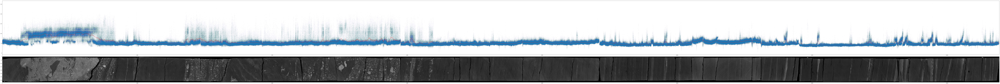

In [8]:
column.mask_breaks()
column.smooth_avg(bwidth=c1.pix_scaler.in_to_px(0.15))
column.show(smooth=True, point_density=True)

/home/ross/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:5: RuntimeWarning: overflow encountered in exp


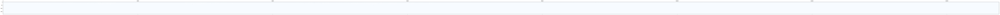

In [32]:
dft = np.apply_along_axis(np.fft.rfft, 1, column.uimg)

fig, ax = plt.subplots(figsize=(200,8))

In [26]:
dft.dtype

dtype('complex128')

In [ ]:
new_col.row_avg_luminance()
new_col.show(percentiles=True)

In [ ]:
new_col.show(fname='PercentilePlot_example.png')

In [ ]:
from functools import reduce
from operator import add


mask = column.uimg > 8000
mask = morphology.binary_erosion(mask, selem=morphology.rectangle(1,6))
mask = morphology.remove_small_holes(mask)

fig, ax = plt.subplots(figsize=(75,100))
ax.imshow(np.concatenate([column.uimg, mask.astype(int)*column.uimg.max()], axis=1), cmap='gray')

In [33]:
import skimage

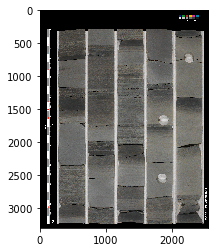

In [34]:
ex = skimage.io.imread('CorePhotos/Ross_core.jpg')
plt.imshow(ex)

In [44]:
exIm = CoreSampleImage(fname='CorePhotos/0.0-20.0.jpg', dtype='uint')

image.gimg.dtype =  uint16


/home/ross/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


KeyboardInterrupt: 

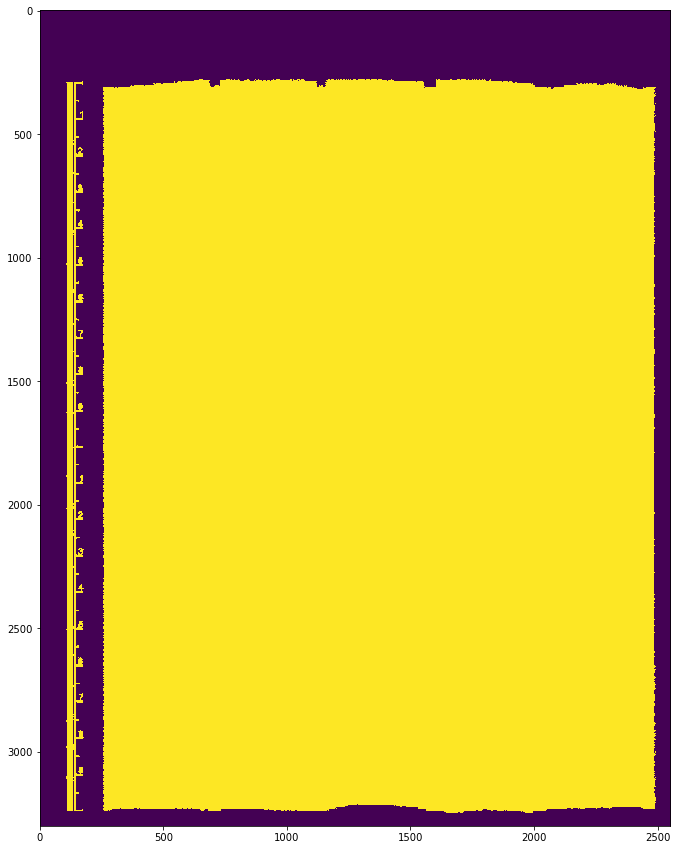

In [45]:
exIm.segment()

In [ ]:
#for j, bucket in enumerate(zip(edges[:-1], edges[1:])):
#    print(vals[j] / vals.max(), bucket)

In [14]:
column.uimg[100,100]

56.0

In [6]:
nonzero_pixloc = np.transpose(column.uimg.nonzero())
npoints = nonzero_pixloc.shape[0]
x = np.zeros(npoints)
y = np.zeros(npoints)
for i, row in enumerate(nonzero_pixloc):
    x[i] = row[0]
    y[i] = column.uimg[row[0], row[1]]

In [ ]:
'''fig, ax = plt.subplots(figsize=(200,17*2/3))
ax.scatter(x,y, s=1, alpha=0.02)
ax.plot(np.arange(new_col.uimg.shape[0]), 
        new_col.smooth_avg(bwidth=c1.pix_scaler.in_to_px(0.1)), color='red', alpha=0.7)
ax.plot(np.arange(new_col.uimg.shape[0]), new_col.row_avg, 'r--', linewidth=0.5)'''

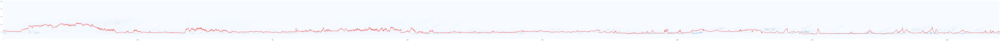

In [50]:
fig, ax = plt.subplots(figsize=(200,8))
nx, ny = int(column.uimg.shape[0]*0.5), 256
Z, xedges, yedges = np.histogram2d(x, y, bins=[nx,ny])
ax.pcolormesh(xedges, yedges, np.log2(Z.T, where=Z.T>1), cmap='Blues')
ax.plot(np.arange(column.uimg.shape[0]), column.row_avg, color='red')

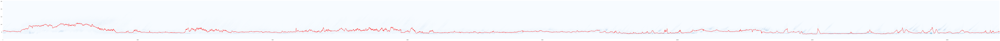

In [48]:
fig, ax = plt.subplots(figsize=(200,8))
nx, ny = int(column.uimg.shape[0]), 256
Z, xedges, yedges = np.histogram2d(x, y, bins=[nx,ny])
ax.pcolormesh(xedges, yedges, np.log2(Z.T, where=Z.T>1), cmap='Blues')
ax.plot(np.arange(column.uimg.shape[0]), column.row_avg, color='red')
#ax.plot(np.arange(column.uimg.shape[0]), column.row_75, color='green')
#ax.plot(np.arange(column.uimg.shape[0]), column.row_25, color='green')

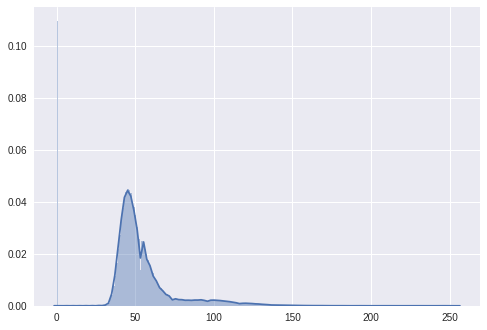

In [44]:
import seaborn as sns
sns.distplot(column.uimg.flatten(), bins=256)

In [1]:
sns.distplot(c1.gimg.flatten())

NameError: name 'sns' is not defined

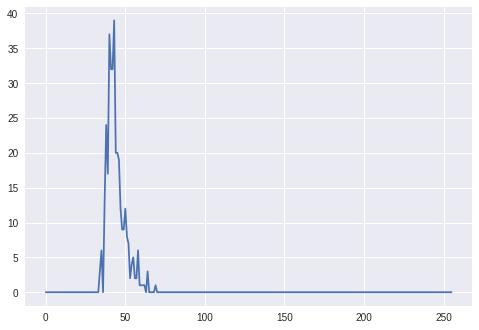

In [43]:

plt.plot(np.arange(256), Z[1750,:])

In [ ]:
type(new_col.uimg[100,100])

In [48]:
1000/c1.gimg.size

0.00011883541295306001

In [ ]:
False * 5